# Introduction to Librosa 

`Librosa` is a Python package for music and audio-analysis.

## Import Libraries

In [28]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as display

## Load Audio Sample With `librosa.load` Default

Load an audio file as a `floating point time series`.

In [29]:
sample, sample_rate = librosa.load('./Samples/Naima.wav')

In [30]:
print(sample_rate)
print(sample.shape)

22050
(355183,)


By default, `librosa.load` method will convert the sampling rate to `22.05khz`, as well as reducing the number of channels to `1`.

## Load Audio Sample With `librosa.load` Extend

See the `librosa.load` documentation to get a complete list of parameters you can use in the `librosa.load` method. Here, we need to modify `sr` and `mono` parameters since our sampling frequency is `44,1kHz` and the number of channels is two.

In [31]:
sample, sample_rate = librosa.load('./Samples/Naima.wav', sr=None, mono=False)

In [32]:
print(sample_rate)
print(sample.shape)
print(sample.min(), sample.max())
print(sample.dtype)

44100
(2, 710366)
-0.63308716 0.6987915
float32


Assign each channels to `sample_left` and `sample_right`.

In [33]:
sample_left = sample[0]
sample_right = sample[1]

### Visualize Stereo Audio Waveform with `librosa.waveshow()`

Visualize the audio waveform in the time domain with `display.waveshow()`

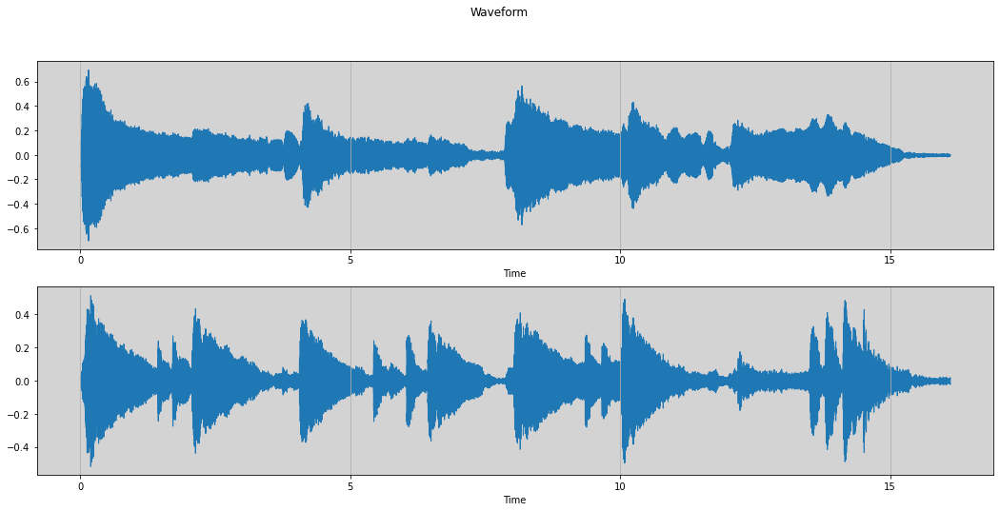

In [34]:
fig, ax = plt.subplots(nrows=2, figsize=(18, 8))
fig.suptitle('Waveform')
left_channel, right_channel = ax

left_channel.grid(True, axis='x')
left_channel.set_facecolor('lightgrey')

right_channel.grid(True, axis='x')
right_channel.set_facecolor('lightgrey')

librosa.display.waveshow(sample_left, sr=sample_rate, ax=left_channel)
librosa.display.waveshow(sample_right, sr=sample_rate, ax=right_channel)


plt.show()

In [35]:
display.Audio(sample, rate=sample_rate)

### Zooming in on a Plot to Show Raw Sample Values

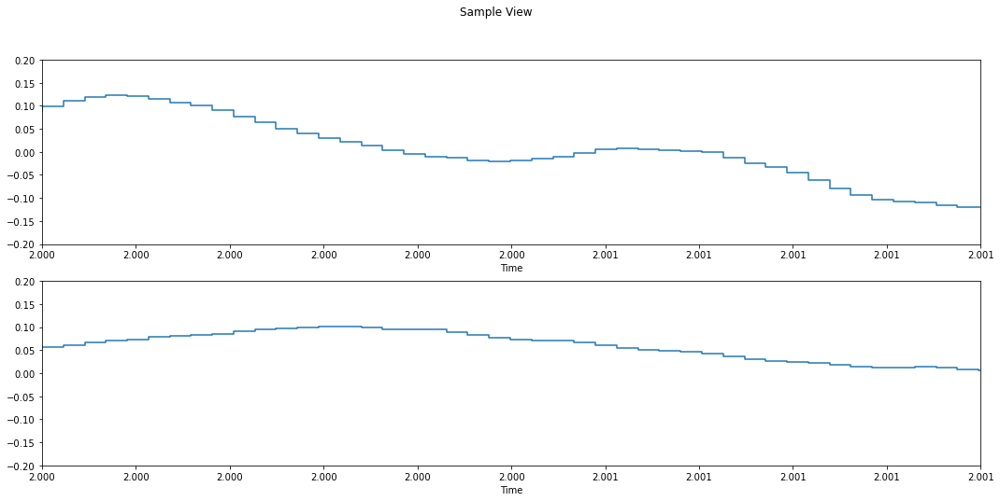

In [36]:
fig, ax = plt.subplots(nrows=2, figsize=(18, 8))
fig.suptitle('Sample View')
left_channel, right_channel = ax
left_channel.set(xlim=[2.0, 2.001], ylim=[-0.2, 0.2])
right_channel.set(xlim=[2.0, 2.001], ylim=[-0.2, 0.2])

librosa.display.waveshow(sample_left, sr=sample_rate, ax=left_channel)
librosa.display.waveshow(sample_right, sr=sample_rate, ax=right_channel)

plt.show()

## The Short-time Fourier Transform

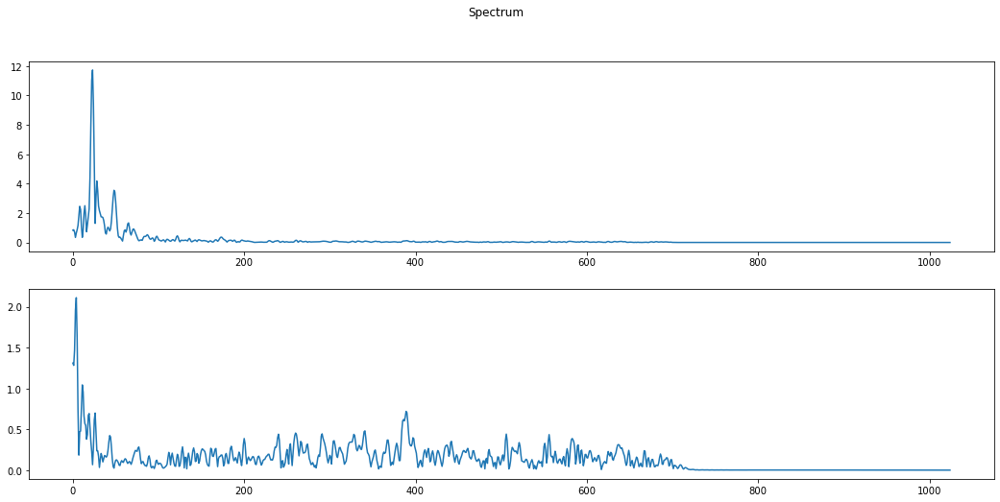

In [37]:
fig, ax = plt.subplots(nrows=2, figsize=(18, 8))
fig.suptitle('Spectrum')
left_channel, right_channel = ax

n_fft = 2048
fourier_transform_left = np.abs(librosa.stft(sample_left[:n_fft], hop_length=n_fft+1))
fourier_transform_right = np.abs(librosa.stft(sample_right[:n_fft], hop_length=n_fft+1))

left_channel.plot(fourier_transform_left)
right_channel.plot(fourier_transform_right)

plt.show()

### The Mel Spectrogram

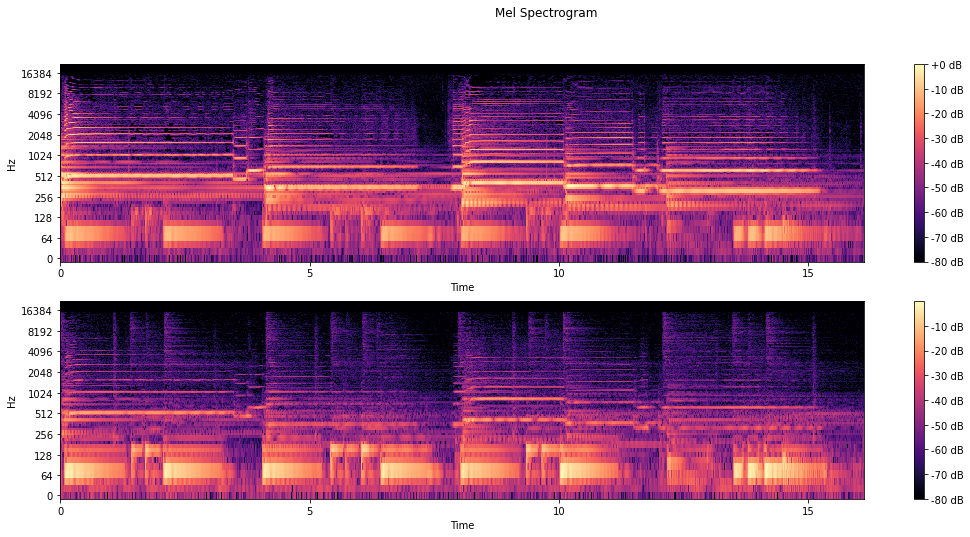

In [40]:
fig, ax = plt.subplots(nrows=2, figsize=(18, 8))
fig.suptitle('Mel Spectrogram')
left_channel, right_channel = ax

# Left channel
spec = np.abs(librosa.stft(sample_left, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
left_spect = librosa.display.specshow(spec, sr=sample_rate, x_axis='time', y_axis='log', ax=left_channel)
fig.colorbar(left_spect, ax=left_channel, format='%+2.0f dB')


# Right channel
spec = np.abs(librosa.stft(sample_right, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
right_spect = librosa.display.specshow(spec, sr=sample_rate, x_axis='time', y_axis='log', ax=right_channel)
fig.colorbar(right_spect, ax=right_channel, format='%+2.0f dB')

plt.show()

## Librosa Audio Effects

#### Pitch Shift

In [25]:
pitch_audio = librosa.effects.pitch_shift(sample, sr=sample_rate, n_steps=-3)
display.Audio(pitch_audio, rate=sample_rate)

#### Time Stretch

In [180]:
stretch_audio = librosa.effects.time_stretch(sample, rate=0.6)
display.Audio(stretch_audio, rate=sample_rate)

## Librosa Source Seperation

#### Harmonic

In [181]:
harmonic_seperation = librosa.effects.harmonic(sample, margin=4.0)
display.Audio(harmonic_seperation, rate=sample_rate)

#### Percussive

In [170]:
percussive_seperation = librosa.effects.percussive(sample, margin=6.0)
display.Audio(percussive_seperation, rate=sample_rate)